In [1]:
from pymongo import MongoClient

client = MongoClient('localhost', 27017)
mongo = client.hai

In [62]:
import time
from datetime import datetime, date
import calendar

start_time = time.time()-3600#calendar.timegm(date(2017, 10, 31).timetuple())
end_time = time.time()#calendar.timegm(date(2017, 11, 2).timetuple())
username = "sean"

In [63]:
query = {"user_name": username, "summary":{"$exists": True}, "time": {"$gt": start_time, "$lt": end_time}}
cams = mongo.images.find(query).distinct("cam_id")
print(cams)

['misc0']


In [64]:
import os
import sys

sys.path.append("..")
os.chdir("/home/sean/HAI/main_server/hai")

import controllers.learner.datasets as ds
ds.port = 27017

In [77]:
query = {"user_name": username, "time": {"$gt": time.time()-3000, "$lt": time.time()}}
print_data = list(mongo.print.find(query))
print(len(print_data))

12


In [78]:
import scipy.misc
import matplotlib.pyplot as plt

%matplotlib inline

image_data = ds.get_event_images(username, print_data, ["misc0"])

In [79]:
print(len(print_data), len(image_data))

12 12


lie


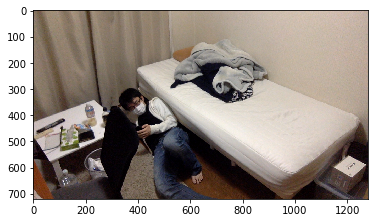

lie


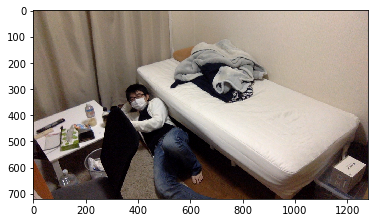

lie


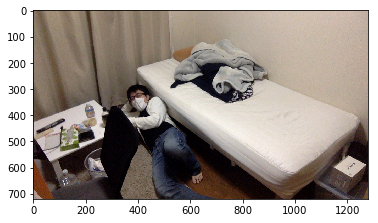

lie


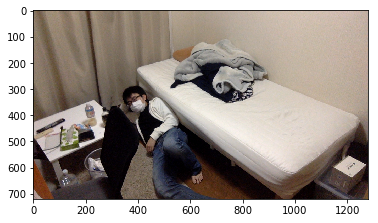

lie


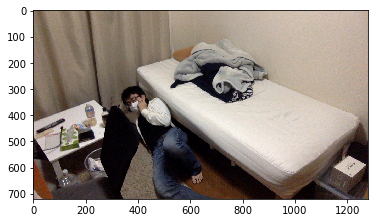

up


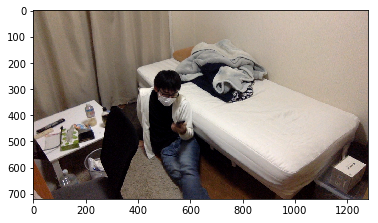

up


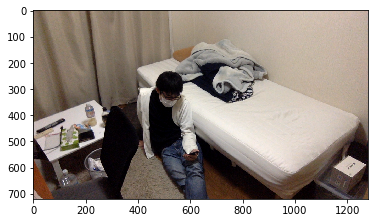

up


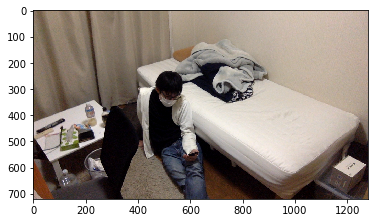

up


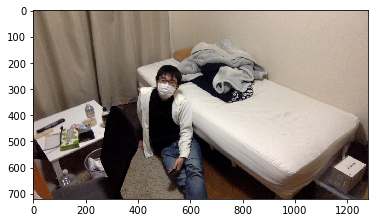

up


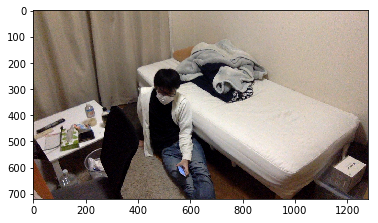

stand


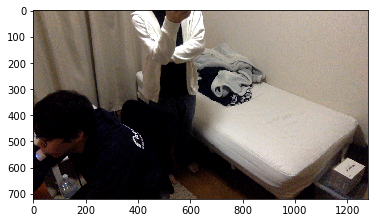

stand


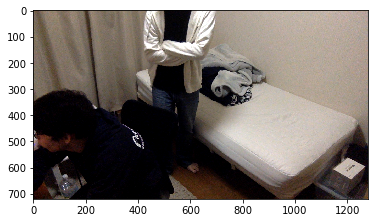

stand


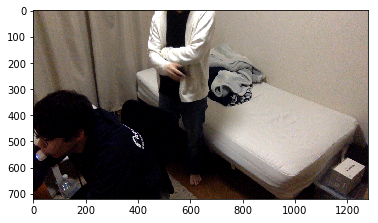

stand


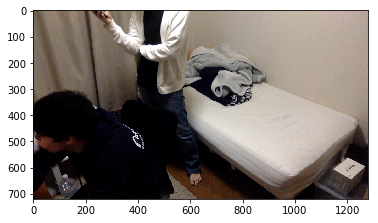

stand


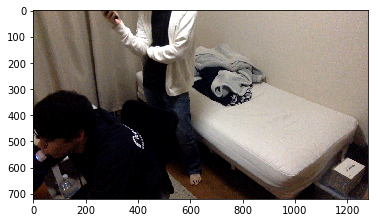

slep


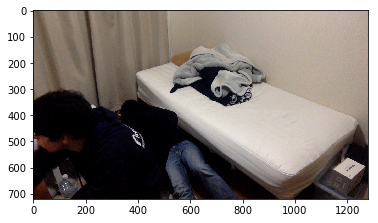

slep


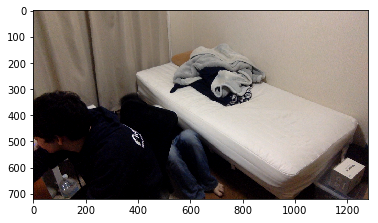

slep


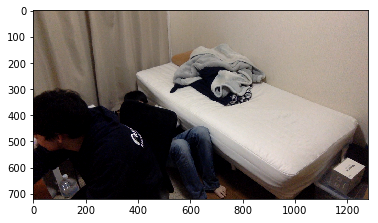

slep


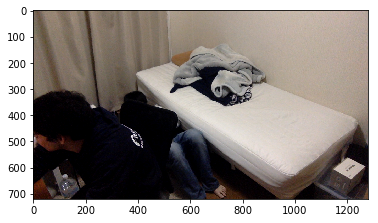

slep


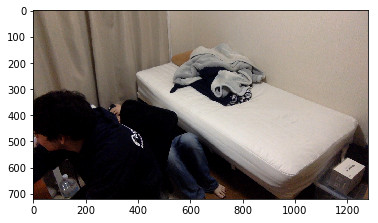

stand


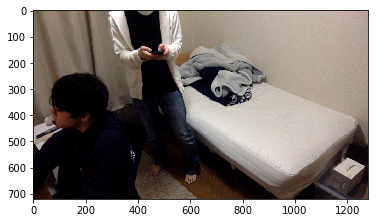

stand


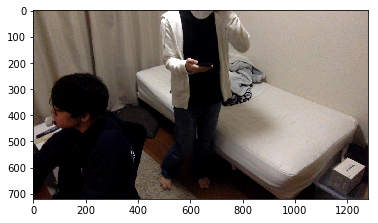

stand


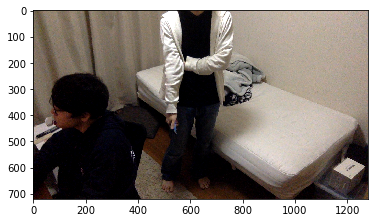

stand


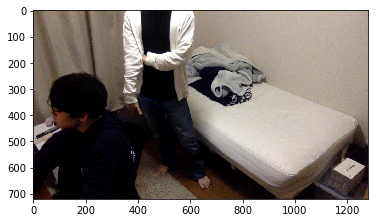

stand


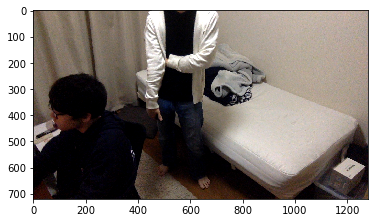

lie


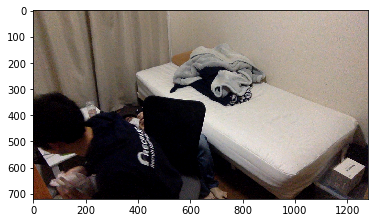

lie


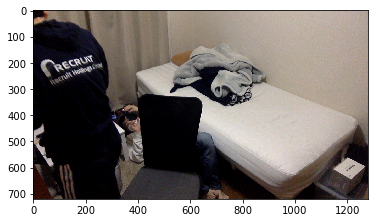

lie


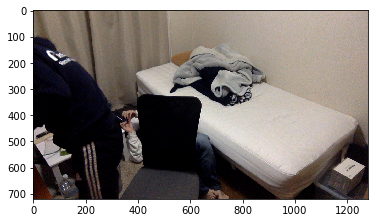

lie


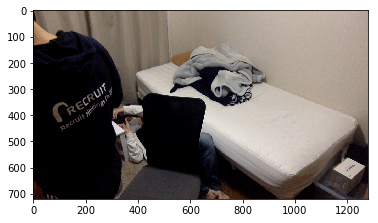

lie


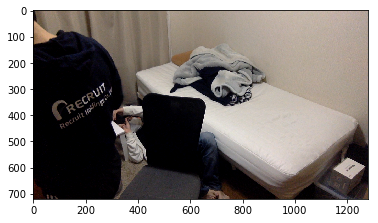

atand


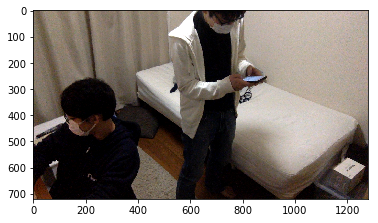

atand


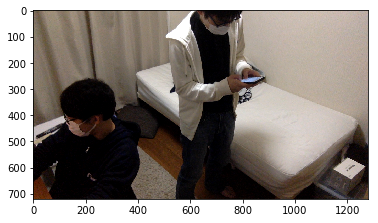

atand


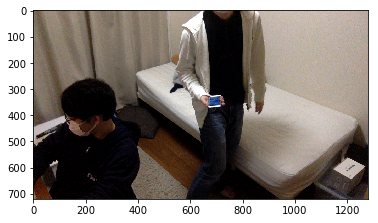

atand


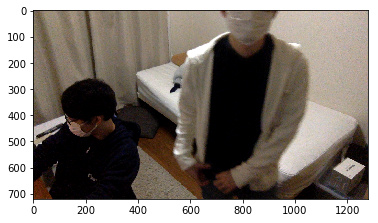

atand


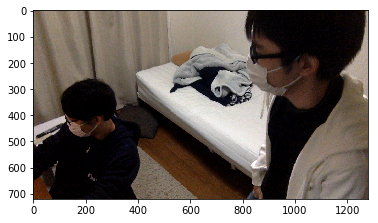

lie


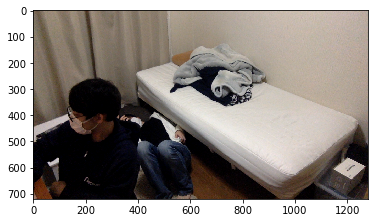

lie


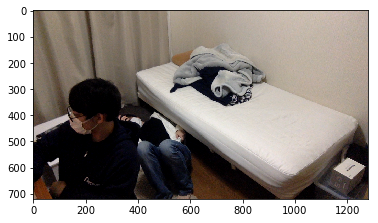

lie


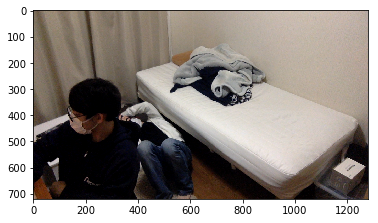

lie


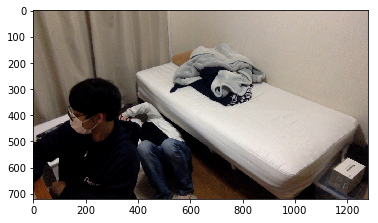

lie


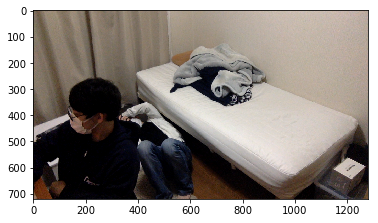

sit


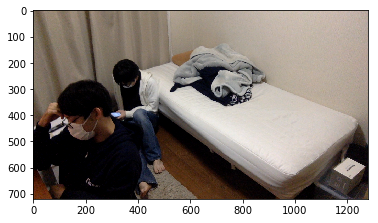

sit


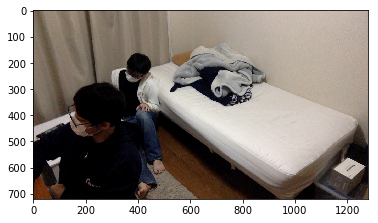

sit


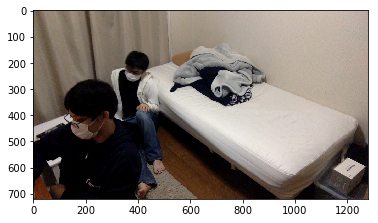

sit


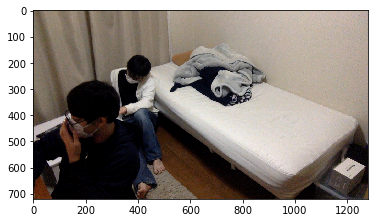

sit


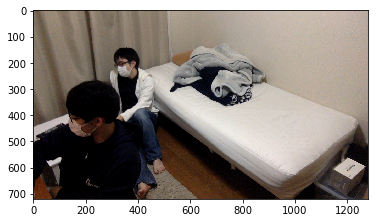

lie


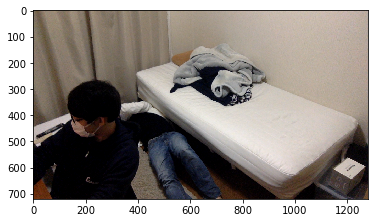

lie


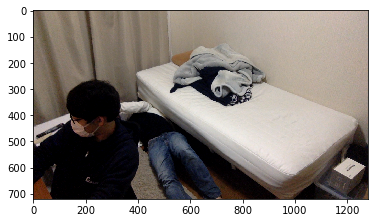

lie


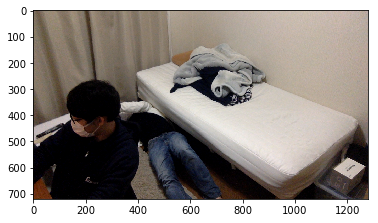

lie


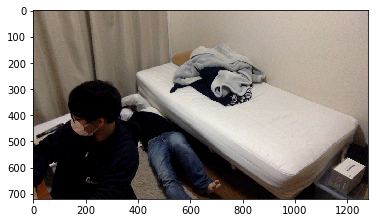

lie


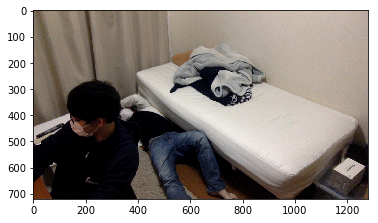

lie


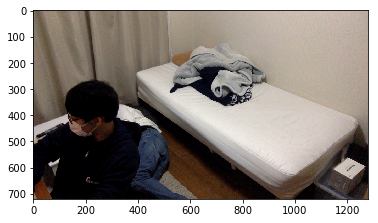

lie


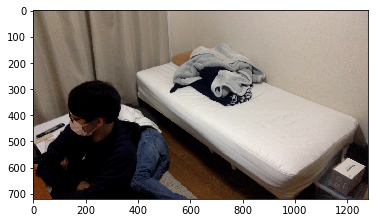

lie


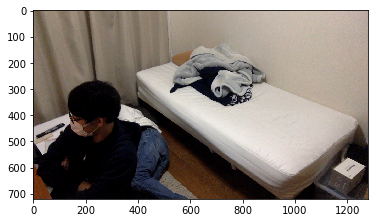

lie


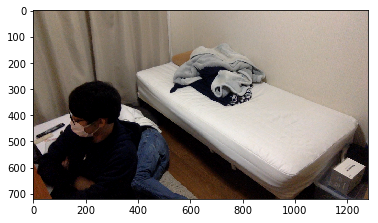

lie


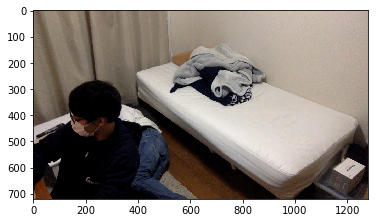

In [80]:
import numpy as np

dataX, dataY = [], []
imagesX = []
classes = list(set([y["text"] for y in print_data]))

for x, y in zip(image_data, print_data):
    for imgs in x:
        row = []
        row_images = []
        skip = False
        for cam in imgs:
            if cam is not None:
                print(y["text"])
                plt.figure()
                plt.imshow(scipy.misc.imread("./images/raw_images/" + cam["filename"]))
                plt.show()
                #row.append(ds.data2vec([], [], cam, False, False, False, True, False, False))
                row_images.append(cam["filename"])
            else:
                skip = True
                break
        if not skip:
            imagesX.append(row_images)
            #dataX.append(np.concatenate(row))
            dataY.append(classes.index(y["text"]))

In [60]:
print(len(dataX), dataY)

0 [0, 0, 0, 0, 0, 1, 1, 1, 1, 1]


In [42]:
def show_images(imgs):
    for img in imgs:
        plt.figure()
        plt.imshow(img)
        plt.show()

In [43]:
img_batch = []

for t in imagesX:
    for img in t:
        mat = scipy.misc.imread("./images/raw_images/" +  img)
        mat = scipy.misc.imresize(mat, (224, 224))
        img_batch.append(mat)

6
0/10
1/10
2/10
3/10
4/10
5/10
6/10
7/10
8/10
9/10
60


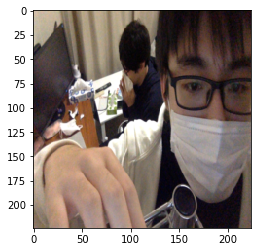

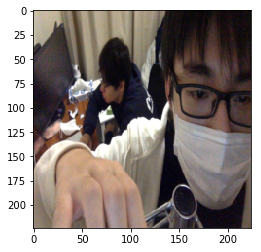

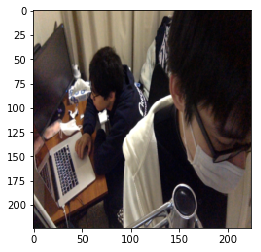

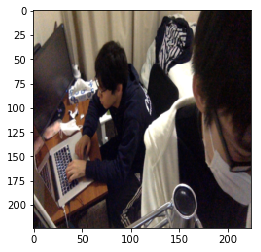

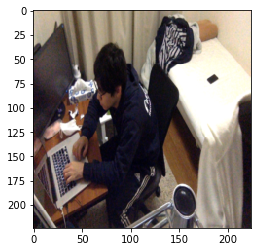

...

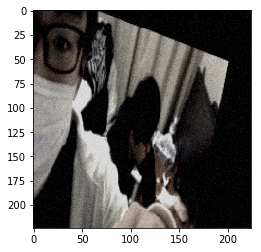

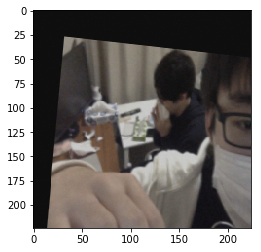

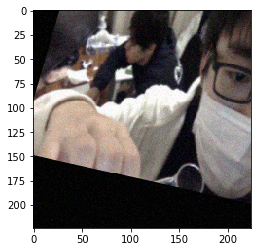

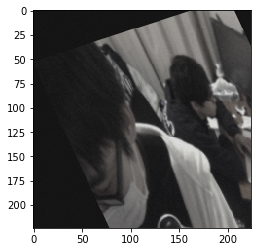

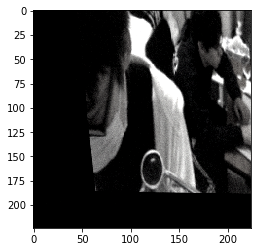

In [44]:
from PIL import Image
times = 10
print(len(img_batch))
aug_imgs = ds.augment_images(img_batch, times)
aug_imgs_pil = [Image.fromarray(img) for img in aug_imgs]
print(len(aug_imgs))
show_images(img_batch[:10])
show_images(aug_imgs[:10])

In [13]:
%load_ext autoreload
%autoreload 2
from controllers.learner.img2vec import img2vec
aug_imgs_pil[0].size

(1280, 720)

In [14]:
vecs = img2vec(aug_imgs_pil)


( 0 ,.,.) = 
  1.1015  0.9474  0.3481  ...   1.8722  1.8208  1.8208
  1.1872  0.9646  0.3309  ...   1.8893  1.8550  1.8379
  1.1700  0.8618  0.2453  ...   1.8893  1.9064  1.8722
           ...             ⋱             ...          
 -0.2171 -0.2171 -0.2171  ...   0.9988  0.9988  1.0331
 -0.2171 -0.2513 -0.2684  ...   1.4783  1.4440  1.3755
 -0.1999 -0.2513 -0.2856  ...   1.7523  1.6153  1.3927

( 1 ,.,.) = 
  1.2381  1.1856  0.7654  ...   2.4286  2.4286  2.4286
  1.3081  1.1506  0.6779  ...   2.4286  2.4286  2.4286
  1.3431  1.0980  0.6078  ...   2.4286  2.4286  2.4111
           ...             ⋱             ...          
 -0.0224 -0.0224 -0.0049  ...   1.3782  1.3431  1.3256
 -0.0049 -0.0224  0.0126  ...   1.7633  1.7108  1.6408
  0.0301  0.0126  0.0476  ...   1.9209  1.8508  1.7283

( 2 ,.,.) = 
  0.3742  0.2696 -0.1661  ...   1.0714  1.0539  1.1062
  0.3742  0.2522 -0.1835  ...   1.1062  1.0714  1.0888
  0.3219  0.1302 -0.3055  ...   1.1411  1.1411  1.1237
           ...         


( 0 ,.,.) = 
  1.0159  1.1015  0.3652  ...   1.9407  1.9064  1.9064
  1.1700  1.0844  0.3481  ...   1.9920  1.9578  1.9235
  1.2214  0.9988  0.1939  ...   1.9407  1.9407  1.8893
           ...             ⋱             ...          
 -0.2171 -0.2171 -0.2684  ...   1.3413  1.4440  1.5810
 -0.1828 -0.2513 -0.2513  ...   1.4269  1.4269  1.2557
 -0.0972 -0.2684 -0.2513  ...   1.8037  1.6495  1.3413

( 1 ,.,.) = 
  1.0455  1.2031  0.7304  ...   2.4111  2.4111  2.4111
  1.1331  1.0980  0.5728  ...   2.4111  2.4111  2.4111
  1.2556  1.0980  0.4678  ...   2.3936  2.3761  2.3585
           ...             ⋱             ...          
 -0.1450 -0.1625 -0.1099  ...   1.7458  1.7458  1.7283
 -0.1975 -0.2500 -0.1275  ...   1.5707  1.5707  1.3431
  0.0126 -0.1275  0.0126  ...   1.7458  1.7283  1.6583

( 2 ,.,.) = 
  0.4788  0.5485 -0.0267  ...   1.1411  1.1411  1.2457
  0.5485  0.5311 -0.0092  ...   1.2457  1.1585  1.1934
  0.4788  0.3742 -0.2184  ...   1.2805  1.2457  1.2457
           ...         

In [15]:
print(len(vecs))
vecs[0].shape

10


(2048,)